**Lab 6: IIR Filtering**


The objective for this lab is to help you understand the relationship between the location
of poles and zeros in the z-domain, the impulse response h[n] in the n-domain, and the frequency
response $H(e^{j\omega})$. We use the system function,
represented as a ratio of polynomials in $z^{-1}$, which can be expressed in either factored or expanded form as:

$$
H(z) = G\frac{\prod_{k=1}^M (1-z_kz^{-1}) }{\prod_{k=1}^N (1-p_kz^{-1})} = \frac{ \sum_{k=0}^M b_kz^{-k}}{ 1- \sum_{k=1}^N a_kz^{-k} }
$$

In [2]:
import numpy as np
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt

from util import load_audio, plot_signals, plot_spectrogram, plot_frequency_response

**1. IIR filters to extract the envelope**

In the previous labs, you extracted the envelope from your reference signal by applying the following system:

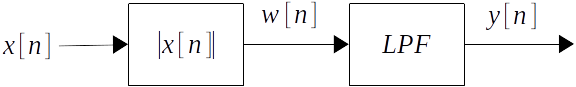

where $w[n] = |x[n]|$ and $y[n]$ was the output of a low-pass FIR filter (averaging filter). In this exercise, you will re-implement this low-pass filter as an IIR.

1.1 First, copy the functions envelope and synthesize from previous work and obtain the same synthesis. 



In [3]:
# Write your code here
def envelope(x, N):
    """
    Extracts the envelope of the input signal x by concatenating a full-wave rectifier and an N-point averaging filter.

    Parameters
    ----------
    x : np.array
        The input signal in the form of a numpy array
    N : int
        The number of points used in N-point averaging filter

    Returns
    -------
    y : np.array
        The output of the system, i.e., the envelope of the signal x.
    """
    # write your code here
    
    w_n = np.abs(x)

    b = np.array([1/N]*N)
    
    y = np.convolve(b,w_n, mode='same')

    return y

def synthesize(f0, phi, Ak, t):
    y = 0
    for k in range(1, len(Ak) + 1):
        y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
    return y

filepath = "sis1_group8/guitar2.wav"
ref, fs = load_audio(filepath)

weights = [1, 0.219, 0.093, 0.024, 0.00427, 0.0028, 0.0015, 0.00098, 0.00146, 0.0019, 0.00168]

from IPython.display import Audio
A = 0.2
f0 = 189.0
phi = -np.pi/4 + 0.0005
Ak = np.array(weights, dtype=float)
t = np.arange(len(ref)) / fs

y = synthesize(f0, phi, Ak, t)
y = A * y / np.max(np.abs(y))

N_env = 1000 #higher N value, more smooth signal
env_synth = envelope(ref, N_env)
final_signal = y * env_synth


1.2 Let's take a look at the following system:

$$
H(z) = G\frac{1+z^{-1}}{1-rz^{-1}} \quad   0<r<1 \quad, G = \frac{1-r}{2}
$$

Note that the coefficients of the filter are the following:

$$
b_0 = 1, \quad b_1 = 1, \quad a_0 = 1, \quad a_1 = -r, \quad
$$

i. Find the zeros and poles of the system analytically.

Could be trasnformed to H(z)=G·(z+1)/(z-r)

We first find the zeros of H(z) as H(z)=0:

If 1+z^-1=0, we have a zero. 1/z=-1; z=-1

One zero of H(z) is z=-1.

To find the poles, H(z) should tend to infinite.

That means that 1-rz^-1 should equal 0.

r/z=1; z=r/1=r

So if z equals r, we have a pole. Also the values of r are inside this.

ii. Use the function `np.roots` to find the zeros and poles using Python. Compare the results with part i.

In [4]:
# Write your code here
zeros = np.roots([1, 1])
print(zeros)
r = 0.5 #value of r for example 0.5
poles = np.roots([1, -r])
print(poles)

[-1.]
[0.5]


The results coincide with the values found analytically. The zero is z=-1, and the pole is the value you assign to r.

iii. Use the function  `plot_zeros_poles(z, p)` to plot the zeros and poles found in ii.

In [5]:
from util import plot_zeros_poles

# Write your code here
plot_zeros_poles(zeros,poles)

1.3 Let's see the frequency response of this filter:



In [6]:
# Write your code here
r = 0.9
G = (1 - r) / 2
b = [G * 1, G * 1]
a = [1, -r]

ww = np.arange(-np.pi, np.pi, np.pi/500) 
_, HH = signal.freqz(b, a, ww)

plot_frequency_response(ww, HH)

1.4. Change the parameter $r$ in the range $(0, 1)$. What happens when $r$ is increased?

For a larger r, the number of bumps also increase for the magnitude, meanining the bandwidth and passband are narrower.

1.5 What type of filter is (low-pass, band-pass, or high-pass filter)?


It's a low pass filter as it preserves low frequencies around zero, and attenuates high frequencies.

1.6 Now we can use this IIR filter to extract the envelope. Let's define a new function `envelope_iir(x)` that applies the filter to the absolute value of the signal. Note that we are using signal.lfilter function to apply the filter.


In [7]:
def envelope_iir(x, r=0.98):
    G = (1 - r)/2
    y = signal.lfilter([G, G], [1,-r], np.abs(x))
    return y

Extract the envelope of your reference signal using both the FIR and IIR filters and compare the results plot them along with the signal. Change the value of $r$ until you are comfortable with the result.

In [8]:
# Write your code here
filepath = "sis1_group8/guitar2.wav"
ref, fs = load_audio(filepath)

N_env = 200
env_synth1= envelope(ref, N_env)
env_synth2 = envelope_iir(ref)

plot_signals([ref, env_synth2, env_synth1], fs, name=['reference', 'IIR', 'FIR'], mode='lines')




1.7 What are the main differences between the two filters? For instance, compare the number of coefficients.

The results between both at first sense look quite similar as they are able of smoothing the signal, but the main difference is found in the number of coefficients used to smooth the signal. The FIR signal receives a parameter N, the one will define the number of coefiicients used as the numerator b. On the other hand, the IIR will only use 4 coefficients, two at the numerator and two at the denominator. This means that the IIR is a simplier method as requires less computations.

1.8 Apply the new envelope (extracted from the IIR filter) to the synthesis generated with the `synthesize` function and listen to the result.

In [9]:
# Write your code here
filepath = "sis1_group8/guitar2.wav"
ref, fs = load_audio(filepath)

weights = [1, 0.219, 0.093, 0.024, 0.00427, 0.0028, 0.0015, 0.00098, 0.00146, 0.0019, 0.00168]

from IPython.display import Audio
A = 0.2
f0 = 189.0
phi = -np.pi/4 + 0.0005
Ak = np.array(weights, dtype=float)
t = np.arange(len(ref)) / fs

y = synthesize(f0, phi, Ak, t)
y = A * y / np.max(np.abs(y))

env_synth = envelope_iir(ref)
final_signal = y * env_synth
display(Audio(final_signal, rate=fs))

---

**2. Band-pass filters**

Now let's work with the following system: 

$$
H(z) = \frac{(1-z^{-1})(1+z^{-1})}{(1-re^{j\omega_n}z^{-1})(1-re^{-j\omega_n}z^{-1})}, \quad 0<r<1
$$

Note that the poles are $p_1 = re^{j\omega_n}$ and $p_2 = re^{-j\omega_n}$; and the zeros are $z_1=1$ and $z_2=-1$. 

2.1 Use the function `plot_zeros_poles` to plot the zeros and poles of the system.

Note: use $w_n = \pi/4$ and $r=0.99$.

In [10]:
# Write your code here
w_n=np.pi/4
r=0.99
plot_zeros_poles([1,-1],[r*np.exp(1j*w_n), r*np.exp(-1j*w_n)])

2.2 Show analytically that $a_k = [1, -2rcos(\omega_n), r^2]$ and $b_k=[1, 0, -1]$.

For bk:

numerator-> (1-z^-1)(1+z^-1)=1 - z^-1 + z^-1 - z^-2 = 1-z^-2 

Degree 0 = 1

Degree 1 = 0

Degree 2 = -z^-2 = -1

For ak:

We will use 2cos(wn)=(e^jwn + e^-jwn)

denominator-> (1-r*(e^(jwn))*z^-1)(1-r*(e^(-jwn))*z^-1) = 1 + (-z^-1)(re^(-jwn) + re^(jwn)) + r^2 * e^0 * z^-2 = 

We transform (-z^-1)(re^(-jwn) + re^(jwn)) as (-r * z^-1)(e^(-jwn) + e^(jwn)) = (-2 * r * z^-1) * cos(wn)

Thus, final: 1 + (r^2 * z^-2) +  (-2 * r * cos(wn))* z^-1

Degree 0 = 1

Degree 1 = (-2 * r * cos(wn))

Degree 2 = r^2

2.3 Plot the frequency response of the filter. Confirm this is a band-pass filter. What's the central frequency of the passband?

In [11]:
# Write your code here
r = 0.99
w_n = np.pi /4
b = [1,0,-1]
a = [1,2 * r * np.cos(w_n), r ** 2]

ww = np.arange(-np.pi, np.pi, np.pi/500) 
_, HH = signal.freqz(b, a, ww)

plot_frequency_response(ww, HH)

It's a band-pass filter as it only let's through values for a specific frequency value and it's surroundings. In this case the central frequencies of the passband are -3pi/4 and 3pi/4.

2.4 Define a function `bpf(x, f, r, fs)` that applies the above band-pass filter. 

Note 1: remember that a frequency can be converted to the normalized radian frequncy by: $\omega_n = 2\pi f_n/f_s$.

Note 2: use `signal.lfilter` function to implement the filter.

In [12]:
def bpf(x, fn, fs, r=0.995):
    """Applies a band-pass filter with central frequency fn

    Parameters
    ----------
    x : np.array
    The input signal in the form of a numpy array
    fn: int or float
    Central frequency of the band pass in Hz 
    fs : int or float
    Frequency rate in Hz
    r: float
    Magnitude of the poles

    Returns
    -------
    y : np.array
    The output of the filter

    """
# Write your code here
    wn = 2*np.pi*fn/fs
    y = signal.lfilter([1,0,-1],[1 , -2 * r * np.cos(wn), r ** 2], x)
    return y

2.5 Regardless of the phase, until now we were synthesizing the instrument signal by summing $K$ harmonics of the signal with different weights ($A_k$) and multiplying the sum by the envelope of the reference signal ($e(t)$):

$$y(t) = e(t) \cdot \sum_{k=1}^K A_k\cos\left(2\pi kf_0 t \right), $$

where $f_0$ is the fundamental frequency of the note. Now we want to improve this synthesis by finding a time-dependent amplitude ($A_k(t)$) for each harmonic:

$$y(t) = \sum_{k=1}^K A_k(t) \cos\left(2\pi kf_0 t \right), $$

where $A_k(t)$ is the amplitude of the harmonic $k$. To extract the amplitudes $A_k(t)$ we'll apply a band-pass filter with central frequency $kf_0$ and calculate the envelope of the output by using the `envelope_iir`.


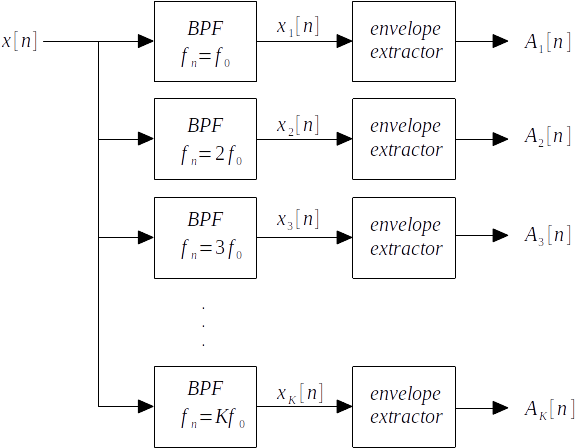

For instance, the following code should extract the envelope of the fundamental frequency component. Change the value of $f_0$ to coincide with your fundamental frequency and check the result. 

In [13]:
# Write your code here
f0= 189.0
filepath = "sis1_group8/guitar2.wav"
ref, fs = load_audio(filepath)

x_k = bpf (ref, f0, fs)
A_k=envelope_iir(x_k)


2.6 Complete the `synthetize_with_bpf` function to implement a synthesis applying different envelopes for each harmonic.


In [14]:
def synthetize_with_bpf(x, f0, phi, K, fs):
    """Synthetizes an harmonic signal using different envelopes for each harmonic
    The envelops are extracted from the reference signal x.

    Parameters
    ----------
    x : np.array
    The reference signal in the form of a numpy array
    f0: int or float
    Fundamental frequency of the synthesis
    phi : float
    Phase
    K: int
    Number of harmonics
    fs : int or float
    Frequency rate in Hz

    Returns
    -------
    y : np.array
    The output of the filter

    """
    # Write your code here
    
    Ts = 1/float(fs)
    t = np.arange(len(ref)) / fs
    
    y=0
    for k in range(1,int(K)+1):
        x_k = bpf (x, k*f0, fs)
        A_k=envelope_iir(x_k)
        y += A_k * np.cos(2*np.pi*k*f0*t +k*phi)
    y = np.amax(x)*y/np.amax(y)
    return y

2.6 Call the function `synthetize_with_bpf` to get the synthesized signal and **listen to it**.

Note that now you can increase the number of harmonics $K$ as you want because we are not manually measuring the weights of each harmonic.

In [15]:
# Write your code here
filepath = "sis1_group8/guitar2.wav"
ref, fs = load_audio(filepath)
phi = -np.pi/4 
synthesized_bpf= synthetize_with_bpf(ref, 189, phi, 100, fs)
display(Audio(synthesized_bpf, rate=fs))



2.7 Compare the **spectrograms** of the synthesized signal and reference signal.

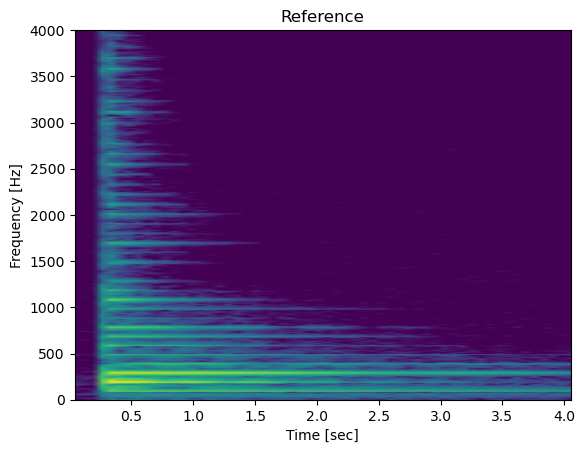

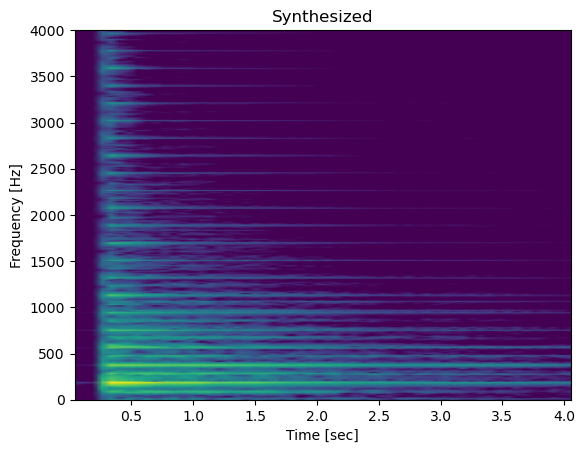

In [16]:
# Write your code here
from scipy.signal import spectrogram

N = 4000

ff, tt, S_ref = spectrogram(ref, fs=fs, nperseg=N, scaling='spectrum' )
ff_int, tt_int, S_int = spectrogram( synthesized_bpf, fs=fs,  nperseg=N, scaling='spectrum')

plot_spectrogram(ff, tt, S_ref);  plt.ylim([0, 4000]); plt.title("Reference");  plt.show()
plot_spectrogram(ff_int, tt_int, S_int); plt.ylim([0, 4000]); plt.title("Synthesized");  plt.show()

